<a href="https://colab.research.google.com/github/Anjana-Girish/training-custom-dataset-dino-and-lattu/blob/main/Train_YOLO_Models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Train YOLO Models in Google Colab
In this notebook colab i have created to identify custom dataset that is dino and lattu !        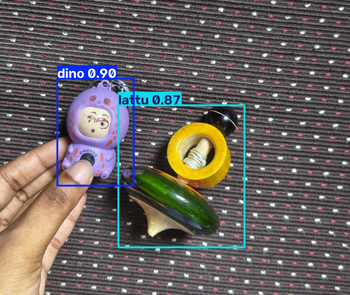

**Verify NVIDIA GPU Availability**

Make sure you're using a GPU-equipped machine by going to "Runtime" -> "Change runtime type" in the top menu bar, and then selecting one of the GPU options in the Hardware accelerator section. Click Play on the following code block to verify that the NVIDIA GPU is present and ready for training.

In [1]:
!nvidia-smi

Wed Sep  9 08:17:56 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   48C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

#1.&nbsp;Gather and Label Training Images

I gathered the images using my phone. Initially, I used a dataset of 37 images, but the prediction accuracy after training was low. Therefore, I increased the dataset size to 72 images, which improved the prediction score. The images were annotated using Roboflow, and the annotated dataset was then downloaded in YOLOv8 format for training.
Below i have attached the image of improvement of the training result(done in roboflow) when the images are increased 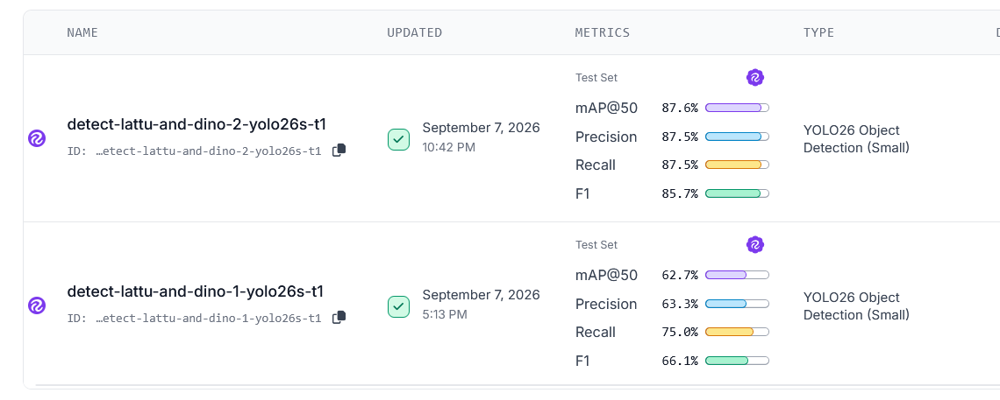

# 2.&nbsp;Upload Image Dataset and Prepare Training Data

## 2.1 Upload images

First, we need to upload the dataset to Colab. Here are a few options for moving the `data.zip` folder into this Colab instance.

**Option 1. Upload through Google Colab**

Upload the `data.zip` file to the Google Colab instance by clicking the "Files" icon on the left hand side of the browser, and then the "Upload to session storage" icon. Select the zip folder to upload it.

<p>
<br>
<img src="https://raw.githubusercontent.com/EdjeElectronics/Train-and-Deploy-YOLO-Models/refs/heads/main/doc/upload-colab-files.png" height="240">
</p>


## 2.1 Copy the images of that zip to the colab and unzip it into data

In [1]:
# Unzip images to a custom data folder
!unzip -q /content/D.zip -d /content/data

replace /content/custom_data/data.yaml? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
checkdir error:  cannot create /content/custom_data/valid
                 No such file or directory
                 unable to process valid/labels/WhatsApp Image 2026-09-07 at 3-52-59 PM(1)_jpeg_jpeg.rf.U2DdU2mh4Wtzuvzkdsep.txt.
checkdir error:  cannot create /content/custom_data/valid
                 No such file or directory
                 unable to process valid/labels/WhatsApp Image 2026-09-07 at 3-52-47 PM_jpeg_jpeg.rf.Fa9Aa9HCmPxAZRdOsVAB.txt.
checkdir error:  cannot create /content/custom_data/valid
                 No such file or directory
                 unable to process valid/labels/WhatsApp Image 2026-09-07 at 3-52-56 PM(5)_jpeg_jpeg.rf.jIY0BNJPkMAGmaJcdZmr.txt.
checkdir error:  cannot create /content/custom_data/valid
                 No such file or directory
                 unable to process valid/labels/WhatsApp Image 2026-09-07 at 3-52-58 PM(2)_jpeg_jpeg.rf.zJDf7cIWURAjjqCbfuyq.txt.

Ultralytics requires a particular folder structure to store training data for models. Ultralytics requires a particular folder structure to store training data for models. The root folder is named “data”. Inside, there are two main folders:

*   **Train**: These are the actual images used to train the model. In one epoch of training, every image in the train set is passed into the neural network. The training algorithm adjusts the network weights to fit the data in the images.


*   **Validation**: These images are used to check the model's performance at the end of each training epoch.

In each of these folders is a “images” folder and a “labels” folder, which hold the image files and annotation files respectively.


I wrote a Python script that will automatically create the required folder structure and randomly move 90% of dataset to the "train" folder and 10% to the "validation" folder. Run the following code block to download and execute the scrpt.(i did not do this as the roboflow has already segregated to train, test and valid)

In [4]:
!wget -O /content/train_val_split.py https://raw.githubusercontent.com/EdjeElectronics/Train-and-Deploy-YOLO-Models/refs/heads/main/utils/train_val_split.py

# TO DO: Improve robustness of train_val_split.py script so it can handle nested data folders, etc
!python train_val_split.py --datapath="/content/custom_data" --train_pct=0.9

--2026-09-09 13:03:05--  https://raw.githubusercontent.com/EdjeElectronics/Train-and-Deploy-YOLO-Models/refs/heads/main/utils/train_val_split.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3203 (3.1K) [text/plain]
Saving to: ‘/content/train_val_split.py’

/content/train_val_ 100%[===================>]   3.13K  --.-KB/s    in 0s      

2026-09-09 13:03:06 (49.8 MB/s) - ‘/content/train_val_split.py’ saved [3203/3203]

Directory specified by --datapath not found. Verify the path is correct (and uses double back slashes if on Windows) and try again.


# 3.&nbsp;Install Requirements (Ultralytics)

Next, we'll install the Ultralytics library in this Google Colab instance. This Python library will be used to train the YOLO model.

In [2]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.4/46.4 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 71.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.4/75.4 kB 8.6 MB/s eta 0:00:00


# 4.&nbsp;Configure Training


There's one last step before we can run training: we need to create the Ultralytics training configuration YAML file. This file specifies the location of your train and validation data, and it also defines the model's classes. An example configuration file model is available [here](https://github.com/ultralytics/ultralytics/blob/main/ultralytics/cfg/datasets/coco128.yaml).

Run the code block below to automatically generate a `data.yaml` configuration file. Make sure you have a labelmap file located at `custom_data/classes.txt`. If you used Label Studio or one of my pre-made datasets, it should already be present. If you assembled the dataset another way, you may have to manually create the `classes.txt` file (see [here](https://github.com/EdjeElectronics/Train-and-Deploy-YOLO-Models/blob/main/doc/classes.txt) for an example of how it's formatted).

In [3]:
!find /content -maxdepth 4 -type d | sort

/content
/content/.config
/content/.config/configurations
/content/.config/logs
/content/.config/logs/2026.08.24
/content/data
/content/data/.ipynb_checkpoints
/content/data/test
/content/data/test/images
/content/data/test/labels
/content/data/train
/content/data/train/images
/content/data/train/labels
/content/data/valid
/content/data/valid/images
/content/.ipynb_checkpoints
/content/sample_data


# 5.&nbsp;Train Model

## 5.1 Training Parameters
Now that the data is organized and the config file is created, we're ready to start training! First, there are a few important parameters to decide on. Visit my article on [Training YOLO Models Locally](https://www.ejtech.io/learn/train-yolo-models) to learn more about these parameters and how to choose them.

**Model architecture & size (`model`):**

There are several YOLO11 models sizes available to train, including `yolo11n.pt`, `yolo11s.pt`, `yolo11m.pt`, `yolo11l.pt`, and `yolo11xl.pt`. Larger models run slower but have higher accuracy, while smaller models run faster but have lower accuracy. I made a brief YouTube video that compares performance of different YOLO models on a Raspberry Pi 5 and a laptop with a RTX 4050 GPU, [check it out here to get a sense of their speed accuracy](https://youtu.be/_WKS4E9SmkA). If you aren't sure which model size to use, `yolo11s.pt` is a good starting point.

You can also train YOLOv8 or YOLOv5 models by substituting `yolo11` for `yolov8` or `yolov5`.


**Number of epochs (`epochs`)**

In machine learning, one “epoch” is one single pass through the full training dataset. Setting the number of epochs dictates how long the model will train for. The best amount of epochs to use depends on the size of the dataset and the model architecture. If your dataset has less than 200 images, a good starting point is 60 epochs. If your dataset has more than 200 images, a good starting point is 40 epochs.


**Resolution (`imgsz`)**

Resolution has a large impact on the speed and accuracy of the model: a lower resolution model will have higher speed but less accuracy. YOLO models are typically trained and inferenced at a 640x640 resolution. However, if you want your model to run faster or know you will be working with low-resolution images, try using a lower resolution like 480x480.


## 5.2 Run Training!

Run the following code block to begin training. If you want to use a different model, number of epochs, or resolution, change `model`, `epochs`, or `imgsz`.

In [5]:
# FORCE the correct data.yaml

yaml_text = """path: /content/data
train: train/images
val: valid/images
test: test/images
nc: 2
names: ['dino', 'lattu']
"""

with open("/content/data.yaml", "w", encoding="utf-8") as f:
    f.write(yaml_text)

# Show the ACTUAL file contents
print("===== ACTUAL data.yaml =====")
with open("/content/data.yaml", "r", encoding="utf-8") as f:
    print(f.read())

===== ACTUAL data.yaml =====
path: /content/data
train: train/images
val: valid/images
test: test/images
nc: 2
names: ['dino', 'lattu']



In [6]:
!yolo detect train data=/content/data.yaml model=yolo11s.pt epochs=60 imgsz=640

Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart#ultralytics-settings.
Ultralytics 8.4.145 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=60, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction

The training algorithm will parse the images in the training and validation directories and then start training the model. At the end of each training epoch, the program runs the model on the validation dataset and reports the resulting mAP, precision, and recall. As training continues, the mAP should generally increase with each epoch. Training will end once it goes through the number of epochs specified by `epochs`.

> **NOTE:** Make sure to allow training to run to completion, because an optimizer runs at the end of training that strips out unneeded layers from the model.

The best trained model weights will be saved in `content/runs/detect/train/weights/best.pt`. Additional information about training is saved in the `content/runs/detect/train` folder, including a `results.png` file that shows how loss, precision, recall, and mAP progressed over each epoch.

#6.&nbsp;Test Model

The model has been trained; now it's time to test it! The commands below run the model on the images in the validation folder and then display the results for the first 10 images. This is a good way to confirm your model is working as expected. Click Play on the blocks below to see how your model performs.

In [7]:
import glob
import os

models = glob.glob("/content/runs/detect/**/weights/best.pt", recursive=True)

print("🔍 Searching for trained models...\n")

if models:
    for model in models:
        print("✅", model)
else:
    print("❌ No best.pt found")

🔍 Searching for trained models...

✅ /content/runs/detect/train/weights/best.pt


In [9]:
!yolo detect predict \
model="/content/runs/detect/train/weights/best.pt" \
source="/content/data/valid/images" \
save=True

Ultralytics 8.4.145 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11s summary (fused): 100 layers, 9,413,574 parameters, 0 gradients, 21.4 GFLOPs

image 1/7 /content/data/valid/images/WhatsApp Image 2026-09-07 at 3-52-47 PM_jpeg_jpeg.rf.Fa9Aa9HCmPxAZRdOsVAB.jpeg: 640x480 1 dino, 1 lattu, 12.3ms
image 2/7 /content/data/valid/images/WhatsApp Image 2026-09-07 at 3-52-55 PM(1)_jpeg_jpeg.rf.otP184B4Xn1niZo2O0H7.jpeg: 640x480 1 dino, 1 lattu, 12.3ms
image 3/7 /content/data/valid/images/WhatsApp Image 2026-09-07 at 3-52-56 PM(5)_jpeg_jpeg.rf.jIY0BNJPkMAGmaJcdZmr.jpeg: 640x480 1 dino, 1 lattu, 12.3ms
image 4/7 /content/data/valid/images/WhatsApp Image 2026-09-07 at 3-52-58 PM(2)_jpeg_jpeg.rf.zJDf7cIWURAjjqCbfuyq.jpeg: 640x480 1 dino, 2 lattus, 12.3ms
image 5/7 /content/data/valid/images/WhatsApp Image 2026-09-07 at 3-52-59 PM(1)_jpeg_jpeg.rf.U2DdU2mh4Wtzuvzkdsep.jpeg: 640x480 1 dino, 1 lattu, 12.3ms
image 6/7 /content/data/valid/images/WhatsApp Image 2026-09-07 at 3-53-02

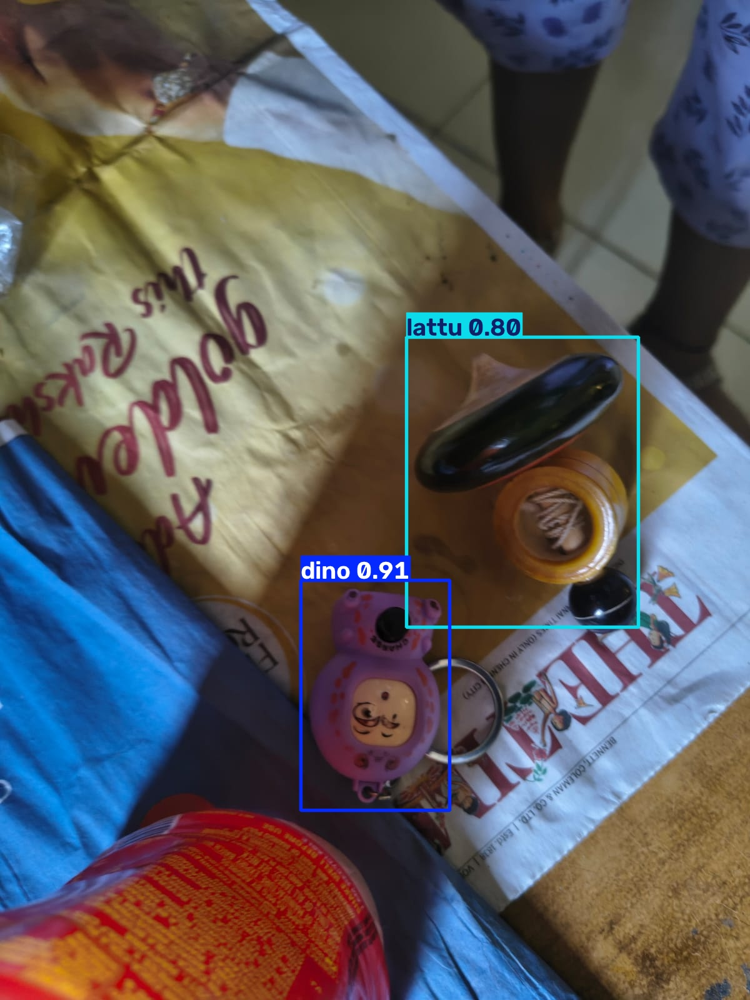

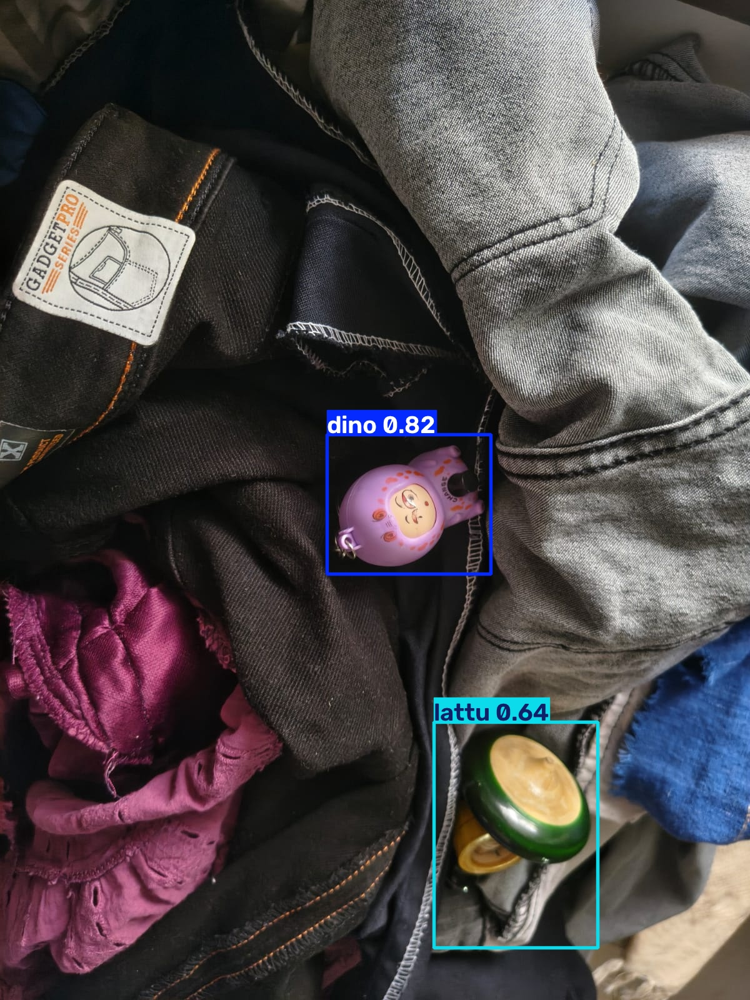

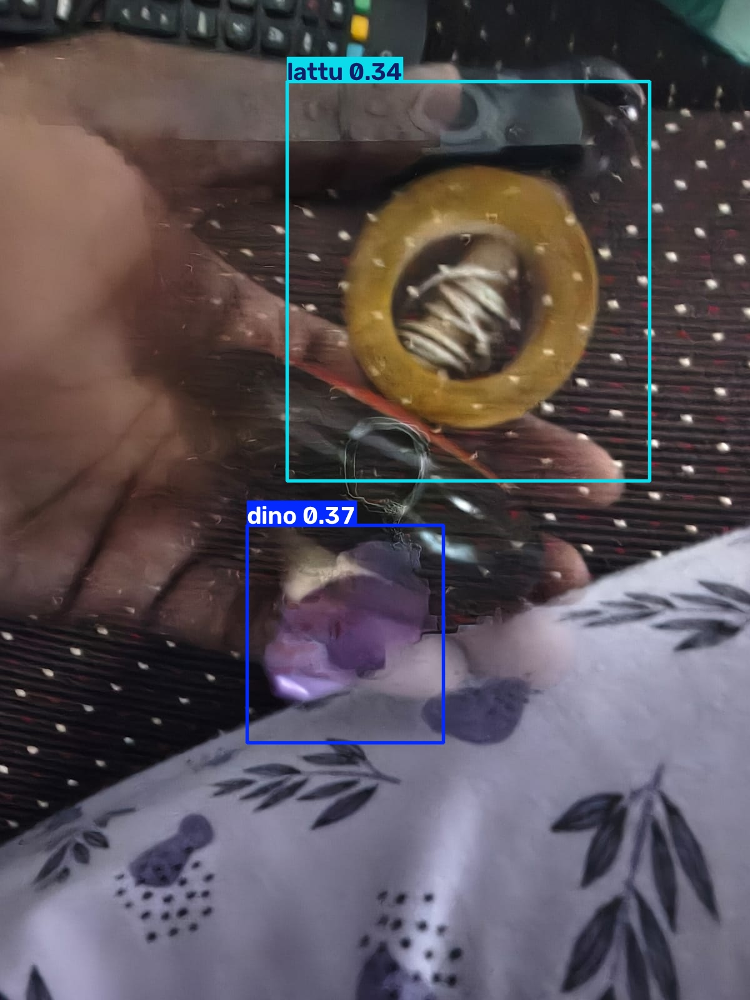

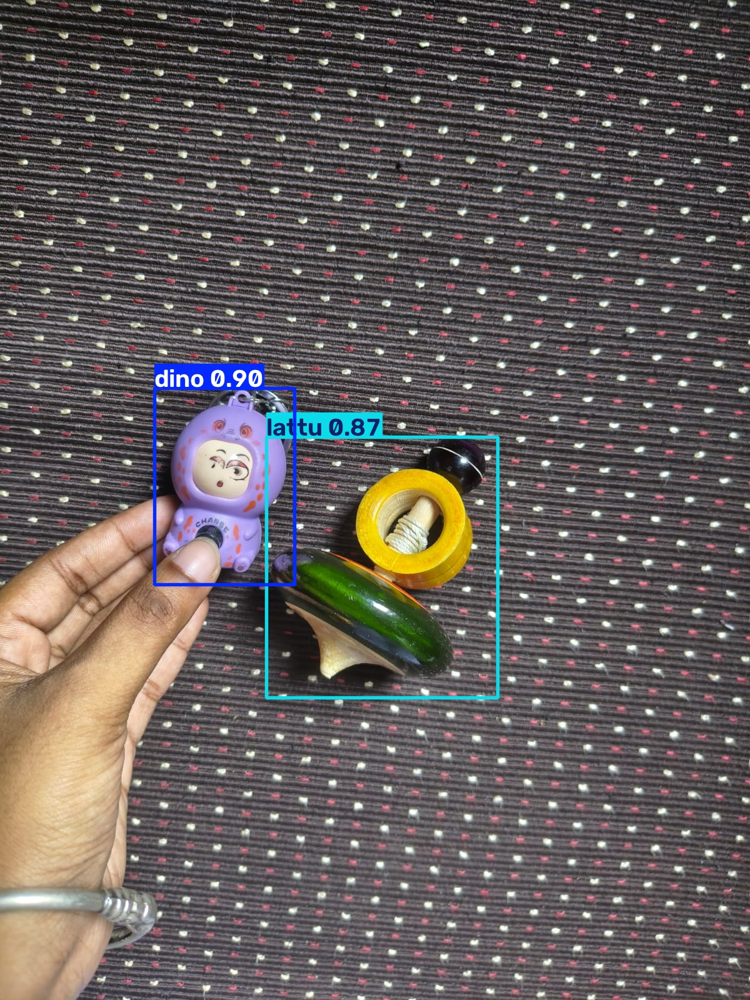

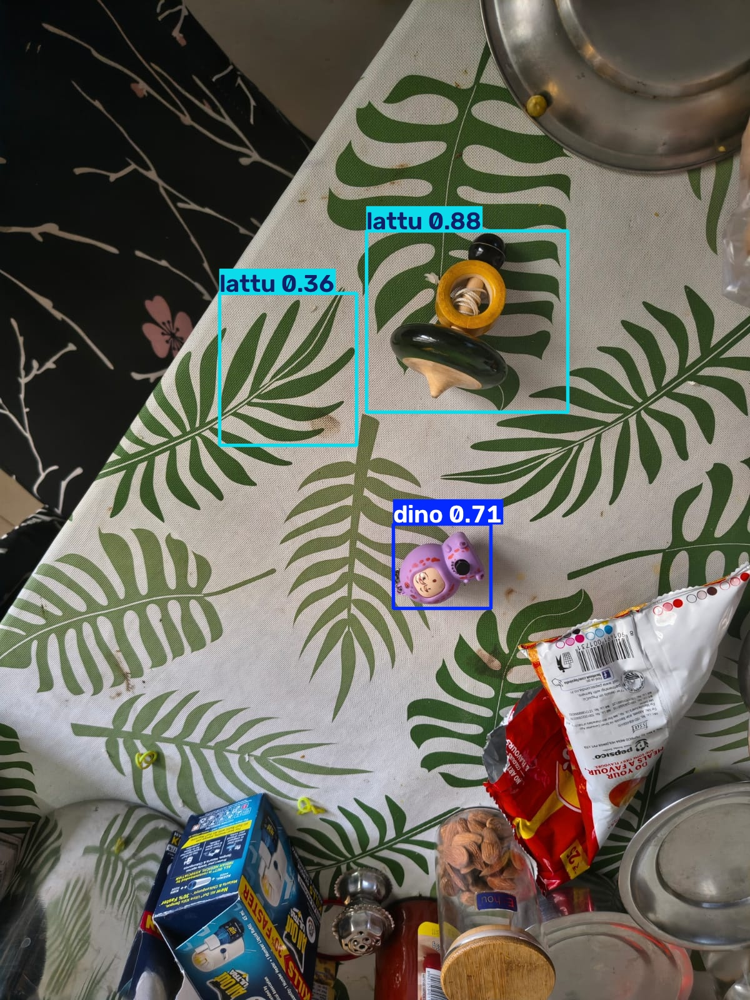

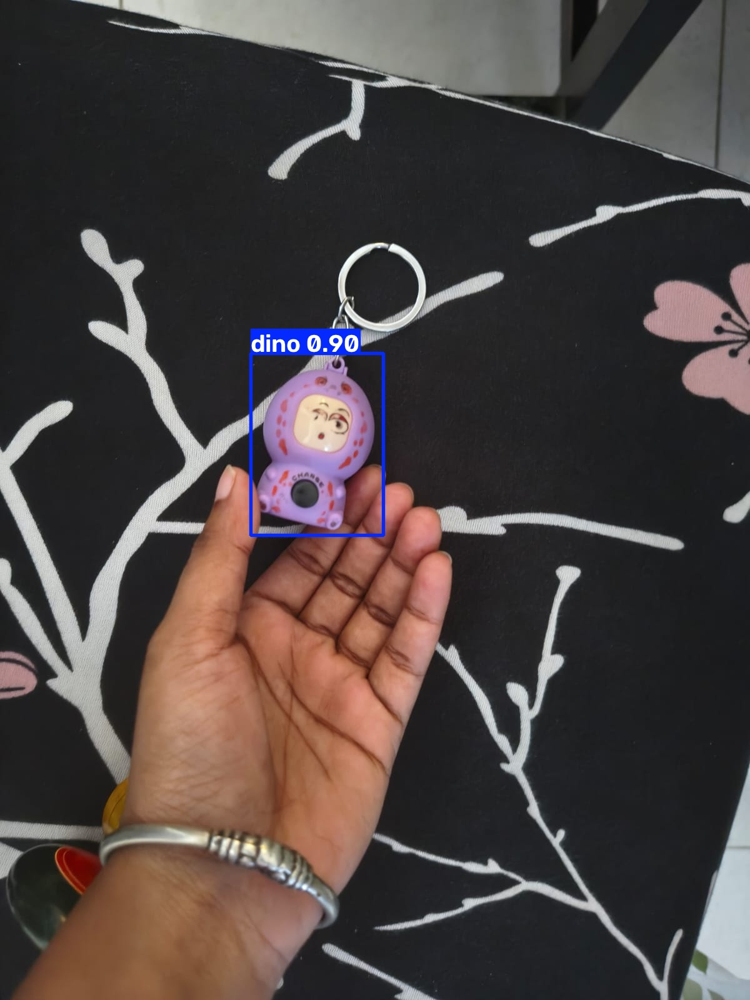

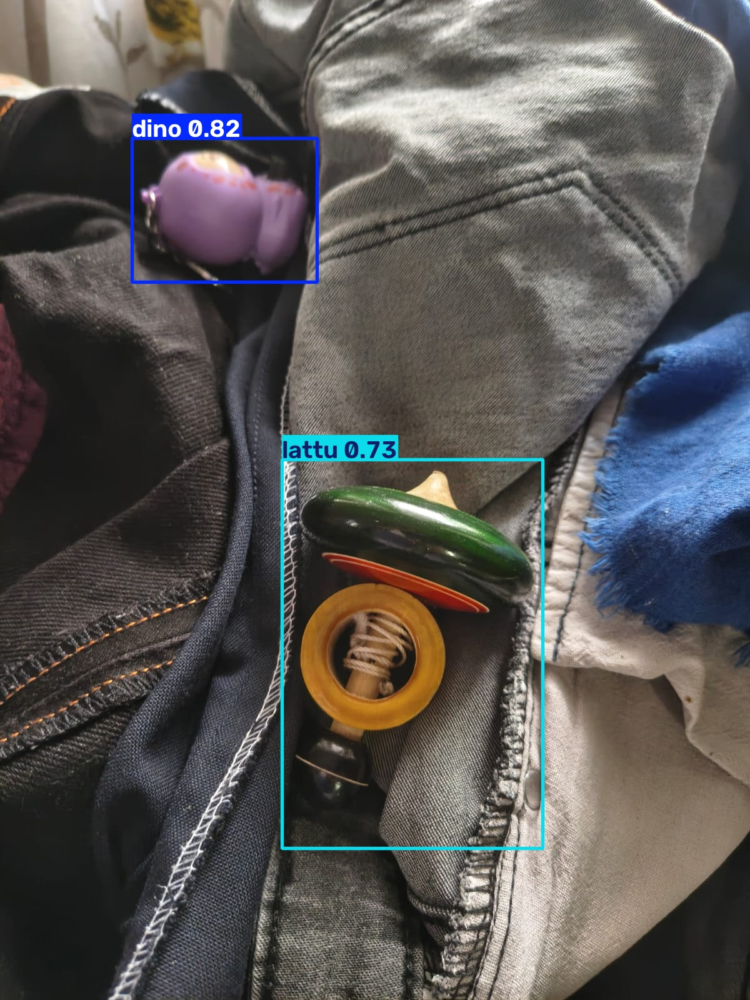

In [11]:
import glob
from IPython.display import Image, display
for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg')[:10]:
  display(Image(filename=image_path, height=400))
  print('\n')


The model should draw a box around each object of interest in each image. If it isn't doing a good job of detecting objects, here are a few tips:

1. Double-check your dataset to make sure there are no labeling errors or conflicting examples.
2. Increase the number of epochs used for training.
3. Use a larger model size (e.g. `yolo11l.pt`).
4. Add more images to the training dataset. See my [dataset video](https://www.youtube.com/watch?v=v0ssiOY6cfg) for tips on how to capture good training images and improve accuracy.

You can also run the model on video files or other images images by uploading them to this notebook and using the above `!yolo detect predict` command, where `source` points to the location of the video file, image, or folder of images. The results will be saved in `runs/detect/predict`.

Drawing boxes on images is great, but it isn't very useful in itself. It's also not very helpful to just run this models inside a Colab notebook: it's easier if we can just run it on a local computer. Continue to the next section to see how to download your newly trained model and run it on a local device.

#7.&nbsp;Deploy Model

Now that your custom model has been trained, it's ready to be downloaded and deployed in an application! YOLO models can run on a wide variety of hardware, including PCs, embedded systems, and phones. Ultralytics makes it easy to convert the YOLO models to various formats (`tflite`, `onnx`, etc.) and deploy them in a variety of environments.

This section shows how to download the model and provides links to instructions for deploying it on your PC and edge devices like the Raspberry Pi.

## 7.1 Download YOLO Model

First, zip and download the trained model by running the code blocks below.

The code creates a folder named `my_model`, moves the model weights into it, and renames them from `best.pt` to `my_model.pt`. It also adds the training results in case you want to reference them later. It then zips the folder as `my_model.zip`.

In [10]:
# Create "my_model" folder to store model weights and train results
!mkdir /content/my_model
!cp /content/runs/detect/train/weights/best.pt /content/my_model/my_model.pt
!cp -r /content/runs/detect/train /content/my_model

# Zip into "my_model.zip"
%cd my_model
!zip /content/my_model.zip my_model.pt
!zip -r /content/my_model.zip train
%cd /content

/content/my_model
  adding: my_model.pt (deflated 9%)
  adding: train/ (stored 0%)
  adding: train/train_batch1.jpg (deflated 3%)
  adding: train/val_batch0_labels.jpg (deflated 8%)
  adding: train/BoxP_curve.png (deflated 31%)
  adding: train/weights/ (stored 0%)
  adding: train/weights/best.pt (deflated 9%)
  adding: train/weights/last.pt (deflated 9%)
  adding: train/BoxF1_curve.png (deflated 35%)
  adding: train/train_batch200.jpg (deflated 9%)
  adding: train/train_batch0.jpg (deflated 4%)
  adding: train/BoxPR_curve.png (deflated 32%)
  adding: train/train_batch2.jpg (deflated 3%)
  adding: train/args.yaml (deflated 53%)
  adding: train/results.csv (deflated 65%)
  adding: train/confusion_matrix_normalized.png (deflated 36%)
  adding: train/BoxR_curve.png (deflated 32%)
  adding: train/confusion_matrix.png (deflated 40%)
  adding: train/train_batch202.jpg (deflated 11%)
  adding: train/train_batch201.jpg (deflated 10%)
  adding: train/results.png (deflated 13%)
  adding: train/la

In [12]:
# This takes forever for some reason, you can also just download the model from the sidebar
from google.colab import files

files.download('/content/my_model.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [14]:
!yolo detect predict \
model="/content/runs/detect/train/weights/best.pt" \
source="/content/video.mp4" \
save=True

Ultralytics 8.4.145 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11s summary (fused): 100 layers, 9,413,574 parameters, 0 gradients, 21.4 GFLOPs

video 1/1 (frame 1/229) /content/video.mp4: 640x384 (no detections), 10.9ms
video 1/1 (frame 2/229) /content/video.mp4: 640x384 (no detections), 15.4ms
video 1/1 (frame 3/229) /content/video.mp4: 640x384 (no detections), 16.9ms
video 1/1 (frame 4/229) /content/video.mp4: 640x384 (no detections), 18.2ms
video 1/1 (frame 5/229) /content/video.mp4: 640x384 (no detections), 19.4ms
video 1/1 (frame 6/229) /content/video.mp4: 640x384 (no detections), 12.0ms
video 1/1 (frame 7/229) /content/video.mp4: 640x384 (no detections), 14.5ms
video 1/1 (frame 8/229) /content/video.mp4: 640x384 (no detections), 14.3ms
video 1/1 (frame 9/229) /content/video.mp4: 640x384 (no detections), 11.3ms
video 1/1 (frame 10/229) /content/video.mp4: 640x384 (no detections), 13.2ms
video 1/1 (frame 11/229) /content/video.mp4: 640x384 (no detections), 

Predection done on the video

In [16]:
import glob

videos = glob.glob("/content/runs/detect/predict*/**/*.mp4", recursive=True)

for v in videos:
    print(v)

In [17]:
from IPython.display import Video, display

display(Video("/content/runs/detect/predict-2/video.avi", embed=True))